## Sheet #9:  Embedding - Luke Longren & Angela Mitrovska 

### Self Organizing Maps (SOMs) and Locally Linear Embedding (LLE)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
from time import time

In [2]:
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
plt.rcParams.update({'font.size': 14})
plt.rcParams["figure.figsize"] = (12,6)

## Exercise 9.1: 1d Self-Organizing Map for 2d data

### (a) Generate $p = 1000$ data points that are uniformly distributed inside the rectangle that is $x ∈ [0, 2] × [0, 1]$:

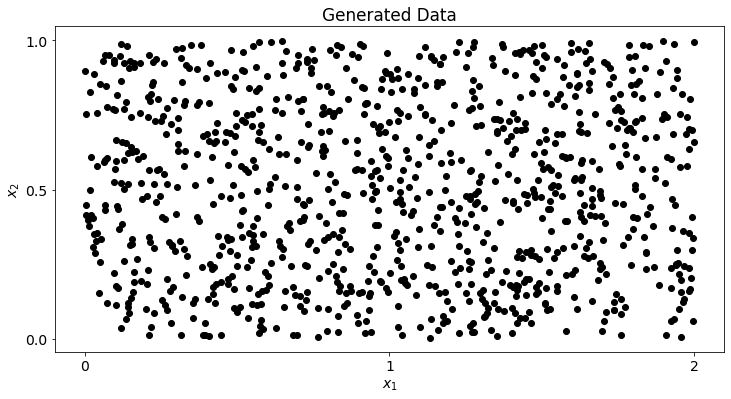

In [3]:
p = 1000  # number of data points
x = np.array([np.random.uniform(0, 2, p), np.random.uniform(0, 1, p)])  # generate data
plt.scatter(x[0], x[1], c='k')
plt.title('Generated Data')
plt.xlabel('$x_1$'), plt.ylabel('$x_2$')
plt.locator_params(nbins=3)
plt.show()

### (b) Implement a one-dimensional Self-Organizing Map using a Gaussian neighborhood function,

# <font color='k'> $ h_{qp} = exp \ (-\frac{(q-p)^2}{2\sigma^2}) $

In [4]:
# neighborhood function, 
# enforces similar learning steps for neighboring neurons
def h_qp(q, p, sigma):
    return np.exp(-(q-p)**2 )#/ (2*sigma**2))

In [5]:
def SOM(x, M, sigma_0, epsilon_0, problem):
    # choose no. M of partitions: M
    # choose annealing schedule: sigma, epsilon
    sigma, epsilon = sigma_0, epsilon_0
    sigma_min, epsilon_min = 0.01, 0.01
    # initialize M prototypes:
    if problem == '1D-3D':
        # initialize prototypes of your map as a chain 
        # with equally spaced links along the z axis
        w_q = np.zeros((M, x.shape[0]))
        w_q[:,-1] = np.linspace(0, 5, M)
    else:
        w_q = np.zeros((M, x.shape[0]))
        for i in range(M):  
            noise = np.random.uniform(-1, 1, x.shape[0])
            w_q[i] = (1/x.shape[1]) * np.sum(x, axis=1) + noise
    # determine closest prototype for random data point
    trial_count = 0
    epsilon_count = 0
    while sigma > sigma_min or epsilon > epsilon_min:
        trial_count += 1
        x_rand = x[:,np.random.randint(x.shape[1])]
        dist = np.zeros(M)
        for i in range(M):
            dist[i] = np.linalg.norm(x_rand - w_q[i])
        p = np.argmin(dist)
        q = [i for i in range(M)]
        # change all prototypes
        w_q += (epsilon * h_qp(q, p, sigma) * (x_rand - w_q).T).T
        # lower the learning rate and neighborhood width
        # learning rate stays until neighborhood width has decayed
        sig_decay = 0.999
        substantial_amount = 0.1
        if sigma <= substantial_amount:
            epsilon_count += 1
            epsilon = epsilon / epsilon_count
            sigma = sigma * sig_decay
        else:  # only reduce the neighborhood width
            sigma = sigma * sig_decay
    return w_q, trial_count

### (c) Fit different maps with M ∈ {4, 8, 16, 32, 64, 128} nodes (prototypes) to the data.

In [6]:
M = [4, 8, 16, 32, 64, 128]
sigma_0 = 1  # initial neighborhood width
epsilon_0 = 1  # initial learning rate

### (d) Plot the final map in the original data space, i.e. the locations of the prototypes and how they are connected to one another. 
### Do so for each number of nodes M separately.

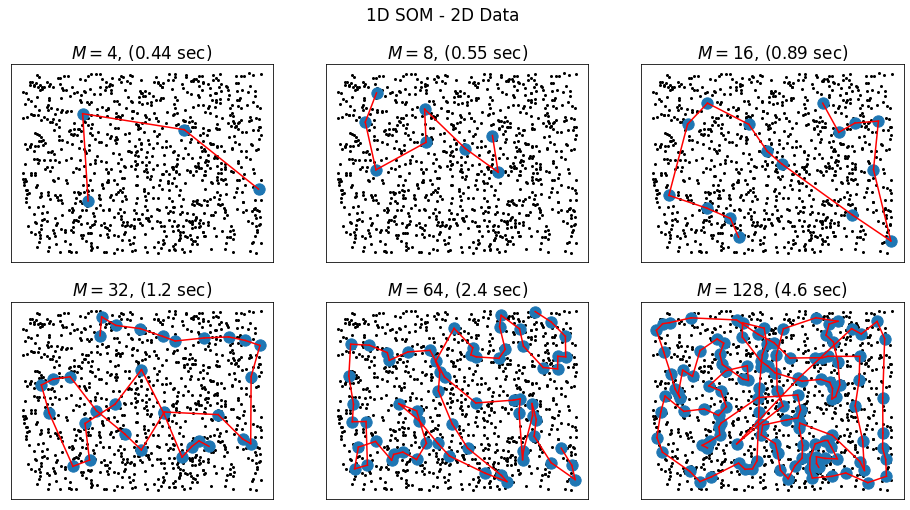

In [7]:
fig, axs = plt.subplots(2, len(M)//2, figsize=(16, 8))
axs = axs.ravel()
for i in range(len(M)):
    t0 = time()
    w_q, trial_count = SOM(x, M[i], sigma_0, epsilon_0, problem='') # calculate map for each M
    t1 = time()
    # plotting the data and the prototypes
    axs[i].scatter(x[0], x[1], c='k', s=2**2)
    axs[i].scatter(w_q[:,0], w_q[:,1], s=2**7)
    axs[i].set_title('$M={0}$, ({1:.2g} sec)'.format(M[i], (t1-t0)))
    # plotting the connections
    for j in range(M[i]-1):
        axs[i].plot([w_q[j,0], w_q[j+1,0]], [w_q[j,1], w_q[j+1,1]], c='r')
plt.suptitle('1D SOM - 2D Data')
plt.setp(axs, xticks=[], yticks=[])
plt.show()

## Exercise 9.2: 1d Self-Organizing Maps for 3d data

### (a) Download and visualize the data contained in the file *spiral.csv*. It contains data described by three coordinates x,y,z.

In [2]:
spiral_data = pd.read_csv(r'C:\Users\lcube\Desktop\jupyter\BCCN\MI2\given\sheet9\spiral.csv')
spiral_data = np.array([spiral_data['x'], spiral_data['y'], spiral_data['z']])

# fig = plt.figure(figsize=(8,6))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(spiral_data[0], spiral_data[1], spiral_data[2], c='k')
# ax.set_title('Spiral Data')
# ax.set_xlabel('$x$'), ax.set_ylabel('$y$'), ax.set_zlabel('$z$')
# ax.locator_params(nbins=2)
# plt.show()

NameError: name 'pd' is not defined

Removed above graph to make file smaller.

### (b) Adapt/reuse your implementation for SOM to fit one dimensional maps with $M ∈ {16, 32, 64, 128}$ nodes to this dataset.

Reusing the implementation of the previous SOM function.

### (c) Initialize the prototypes of your map as a chain with equally spaced links along the z axis, 
### i.e. with $x = 0$, $y = 0$, and $z = 0, . . . , 5$.

Did this with an *if* loop in the SOM function.

### (d) Plot the final prototypes of the map in the data space (for each value for M separately)

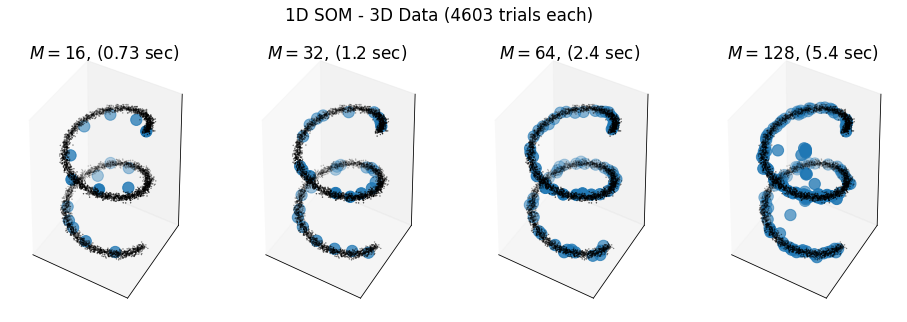

In [9]:
M = [16, 32, 64, 128]

fig = plt.figure(figsize=(16, 5))
for i in range(len(M)):
    t0 = time()
    w_q, trial_count = SOM(spiral_data, M[i], sigma_0, epsilon_0, problem='1D-3D') # calculate map for each M
    t1 = time()
    # plotting the data and the prototypes
    axs = fig.add_subplot(1, len(M), i+1, projection='3d')
    axs.scatter(spiral_data[0], spiral_data[1], spiral_data[2], c='k', s=2**-3)
    axs.scatter(w_q[:,0], w_q[:,1], w_q[:,2], s=2**7)
    axs.set_title('$M={0}$, ({1:.2g} sec)'.format(M[i], (t1-t0)))
    plt.setp(axs, xticks=[], yticks=[], zticks=[])
plt.suptitle('1D SOM - 3D Data ({0} trials each)'.format(trial_count))
plt.show()

## Exercise 9.3: 2d Self-Organizing Maps for 3d data

### (a) Visualize the 3d-data in the file bowl.csv.

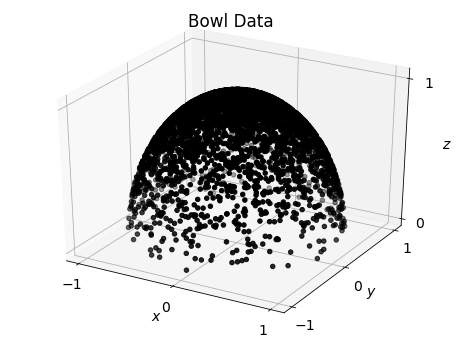

In [10]:
bowl_data = pd.read_csv(r'C:\Users\lcube\Desktop\jupyter\BCCN\MI2\given\sheet9\bowl.csv')
bowl_data = np.array([bowl_data['x'], bowl_data['y'], bowl_data['z']])

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(bowl_data[0], bowl_data[1], bowl_data[2], c='k')
ax.set_title('Bowl Data')
ax.set_xlabel('$x$'), ax.set_ylabel('$y$'), ax.set_zlabel('$z$')
ax.locator_params(nbins=2)
plt.show()

### (b) Extend your SOM implementation to fit two-dimensional maps with an $M × M$ (cartesian) grid topology to this dataset. Set $M ∈ {8, 16, 32}$ as far as your computing resources allow it. Extend your neighborhood function accordingly (i.e. $h_{qp} → h_{\bar{q} \bar{p}}$).

We shall just take the previous SOM function, and modify it to fit 2D maps.

In [11]:
def SOM_2D(x, M, sigma_0, epsilon_0, initial, stop_time):
    # choose no. M of partitions: M
    # choose annealing schedule: sigma, epsilon
    sigma, epsilon = sigma_0, epsilon_0
    sigma_min, epsilon_min = 0.01, 0.01
    # initialize M prototypes:
    if initial == 'informed':
        w_q = np.zeros((M, M, x.shape[0]))  # add another M dimension here
        for i in range(M):  
            for j in range(M):
                mean = np.mean(x, axis=1)
                w_q[i,j] = np.random.normal(mean, 0.1, x.shape[0])
    elif initial == 'random':
        w_q = np.zeros((M, M, x.shape[0]))  # add another M dimension here
        for i in range(M):  
            for j in range(M):
                noise = np.random.uniform(-1, 1, x.shape[0])
                w_q[i,j] = (1/x.shape[1]) * np.sum(x, axis=1) + noise
    if stop_time == 't0':
        return w_q, 0
    else: pass
    # determine closest prototype for random data point
    trial_count = 0
    epsilon_count = 0
    while sigma > sigma_min or epsilon > epsilon_min:
        if stop_time == 'half' and trial_count == 2000:
            return w_q, trial_count
        else: pass
        trial_count += 1
        x_rand = x[:,np.random.randint(x.shape[1])]
        dist = np.zeros((M,M))
        for i in range(M):
            for j in range(M):
                dist[i,j] = np.linalg.norm(x_rand - w_q[i,j]) 
        p = np.zeros(M)
        for i in range(M):
            p[i] = np.argmin(dist[:,i])
        q = [i for i in range(M)]  # just use this twice, as q1=q2
        # change all prototypes
        for i in range(M):
            w_q[i] += (epsilon * h_qp(q, p[i], sigma) * (x_rand - w_q[i]).T).T
        # lower the learning rate and neighborhood width
        # learning rate stays until neighborhood width has decayed
        sig_decay = 0.999
        substantial_amount = 0.1
        if sigma <= substantial_amount:
            epsilon_count += 1
            epsilon = epsilon / epsilon_count
            sigma = sigma * sig_decay
        else:  # only reduce the neighborhood width
            sigma = sigma * sig_decay
    return w_q, trial_count

### (c) Experiment with different ways for initializing the prototypes:
### (i) randomly,
### (ii) in an informed way

Didn't have the time to manage a truly proper 'informed' way, but did center them around the mean also.

### (d) Plot the map in data space (protoype locations and their “connections”) at:
### (i) $t_0$,
### (ii) at some intermediate iteration, and
### (iii) in its final configuration

Illustrating these maps in three dimensions, with connections, is a bit difficult.  
Here is our attempt though:

In [1]:
# M = [8, 16, 32]
# stop_time = ['t0', 'half', 'final']

# fig = plt.figure(figsize=(14, 12))
# for j in range(len(stop_time)):
#     for i in range(len(M)):
#         w_q, trial_count = SOM_2D(bowl_data, M[i], sigma_0, epsilon_0, initial='random', stop_time=stop_time[j])
#         # plotting the data and the prototypes
#         axs = fig.add_subplot(len(stop_time), len(M), (i+1)+j*len(stop_time), projection='3d')
#         axs.scatter(bowl_data[0], bowl_data[1], bowl_data[2], c='k', s=2**-3)
#         axs.scatter(w_q[:,:,0], w_q[:,:,1], w_q[:,:,2], s=2**6)
#         axs.set_title('$M={0}$, $t={1}$'.format(M[i], trial_count))
#         plt.setp(axs, xticks=[], yticks=[], zticks=[])
#         # plotting the connections
#         for k in range(M[i]-1):
#             for l in range(M[i]-1):
#                 axs.plot([w_q[k,l,0], w_q[k+1,l+1,0]], [w_q[k,l,1], w_q[k+1,l+1,1]], [w_q[k,l,2], w_q[k+1,l+1,2]], c='r')
# plt.suptitle('2D SOM - 3D Data, Initially Random')
# plt.show()

Removed above graph to make file smaller.

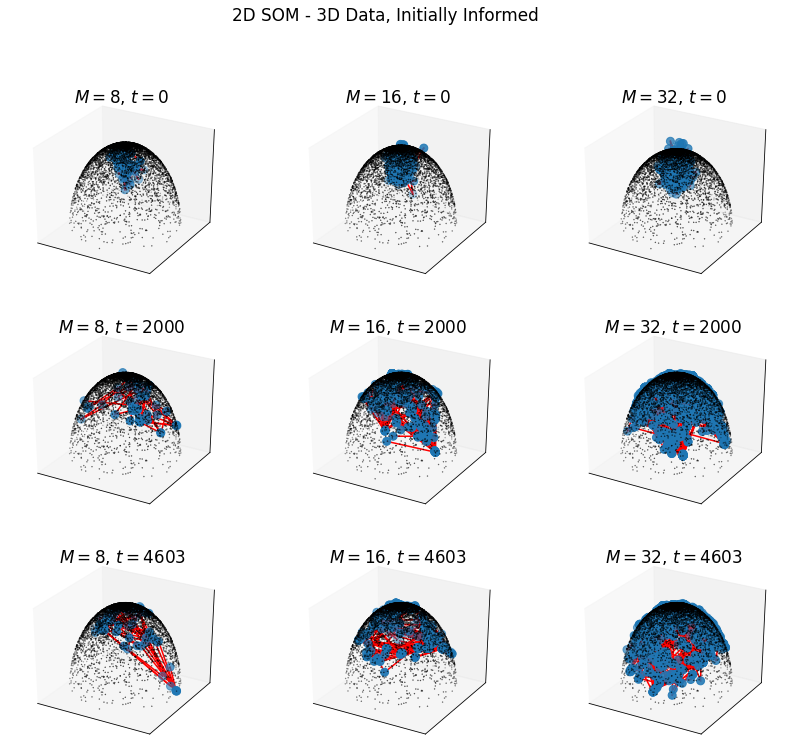

In [13]:
fig = plt.figure(figsize=(14, 12))
for j in range(len(stop_time)):
    for i in range(len(M)):
        w_q, trial_count = SOM_2D(bowl_data, M[i], sigma_0, epsilon_0, initial='informed', stop_time=stop_time[j])
        # plotting the data and the prototypes
        axs = fig.add_subplot(len(stop_time), len(M), (i+1)+j*len(stop_time), projection='3d')
        axs.scatter(bowl_data[0], bowl_data[1], bowl_data[2], c='k', s=2**-3)
        axs.scatter(w_q[:,:,0], w_q[:,:,1], w_q[:,:,2], s=2**6)
        axs.set_title('$M={0}$, $t={1}$'.format(M[i], trial_count))
        plt.setp(axs, xticks=[], yticks=[], zticks=[])
        # plotting the connections
        for k in range(M[i]-1):
            for l in range(M[i]-1):
                axs.plot([w_q[k,l,0], w_q[k+1,l+1,0]], [w_q[k,l,1], w_q[k+1,l+1,1]], [w_q[k,l,2], w_q[k+1,l+1,2]], c='r')
plt.suptitle('2D SOM - 3D Data, Initially Informed')
plt.show()

## Exercise 9.4: Locally Linear Embedding

### 1. Find an off-the-shelf implementation for Locally Linear Embedding (e.g. Scikit-Learn).

We shall use the sklearn LLE module.

In [14]:
from sklearn.manifold import LocallyLinearEmbedding as LLE

### 2. Apply LLE to the toy data sets above using:
### • $M = 1$ embedding dimensions for the spiral data,
### • $M = 1$ and $M = 2$ embedding dimensions for the bowl data.

In [15]:
n_neighbors = 20

In [16]:
spiral_embedding = LLE(n_neighbors, 1)
spiral_transformed = spiral_embedding.fit_transform(spiral_data.T).T
spiral_transformed.shape

(1, 5000)

In [17]:
bowl_embedding1 = LLE(n_neighbors, 1)
bowl_transformed1 = bowl_embedding1.fit_transform(bowl_data.T).T
bowl_transformed1.shape

(1, 5000)

In [18]:
bowl_embedding2 = LLE(n_neighbors, 2)
bowl_transformed2 = bowl_embedding2.fit_transform(bowl_data.T).T
bowl_transformed2.shape

(2, 5000)

### 3. Plot the data points in embedding space using an arbitrary color scheme 
### (required for the next step; see LLE lecture slides for an example from Roweis & Saul).

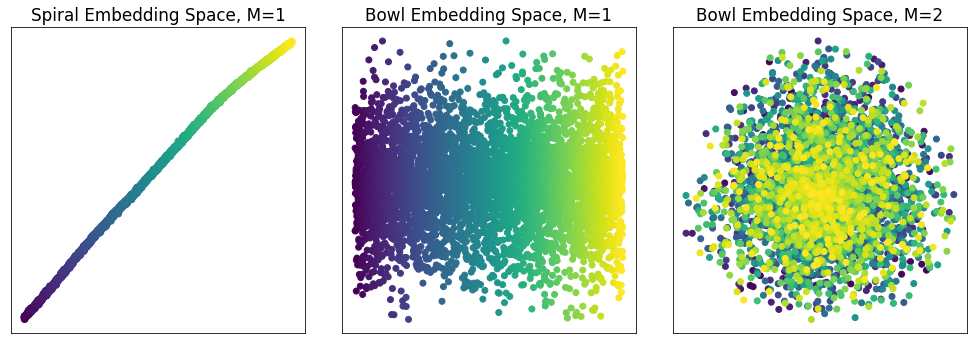

In [19]:
fig, axs = plt.subplots(1, 3, figsize=(14,5))
spiral_colors = plt.cm.viridis(np.linspace(0, 1, spiral_data.shape[1]))
bowl_colors = plt.cm.viridis(np.linspace(0, 1, bowl_data.shape[1]))

axs[0].scatter(np.arange(0, spiral_transformed.shape[1], 1), spiral_transformed, c=spiral_colors)
axs[0].set_title('Spiral Embedding Space, M=1')

axs[1].scatter(np.arange(0, bowl_transformed1.shape[1], 1), bowl_transformed1, c=bowl_colors)
axs[1].set_title('Bowl Embedding Space, M=1')

axs[2].scatter(bowl_transformed2[0], bowl_transformed2[1], c=bowl_colors)
axs[2].set_title('Bowl Embedding Space, M=2')

plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
plt.tight_layout()
plt.show()

### 4. Plot the data points in data space using the same colors as in embedding space above to indicate the distance of the data points within the obtained low-dimensional manifold.

In [3]:
# fig = plt.figure(figsize=(12,5))

# ax = fig.add_subplot(121, projection='3d')
# ax.scatter(spiral_data[0], spiral_data[1], spiral_data[2], c=spiral_colors)

# ax = fig.add_subplot(122, projection='3d')
# ax.scatter(bowl_data[0], bowl_data[1], bowl_data[2], c=bowl_colors)

# plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[], zticks=[])
# plt.tight_layout()
# plt.show()

Removed above graph to make file smaller.